# The idea

This is **part 2** of my October 2021 exploration into variability definitions.

**Part 1** ([link](Prototyping-all-variables-(part-1).ipynb)) focused on exploring the distribution of periodic variables in magnitude-Stetson space. The mininum Stetson index for a confirmed periodic variable was 0.84, 0.60, and 0.63 (for WSERVS 5, 7, and 8 respectively). That's good to know.

In a **previous notebook** ("New\ prototyping\ data\ quality\ criteria-Copy1.ipynb") we fleshed out (a) where it would make sense to draw the Stetson cutoffs, and (b) coded up the selection for Q2, Q1, and Q0 variables and candidates for each region. Can we reproduce much of that and bring it here? *NOTE:* Looks like the work I did there is extended in **another notebook, "Variability Maps"** - that's where I seem to have derived a `min_Stetson_list`, which seems to be key here. This parameter, `min_Stetson_list`, also seems to show up in a variety of other places (e.g., "Prototyping the triptych plot", "Periodograms of many variables", "Exploring High-Amplitude Variables"). Which one received my attention most recently?

In **another previous notebook** ("Brown Dwarf HR diagrams with usable lightcurves only- variability stats and lightcurves"), we coded up what it means to load only the "approved" sample of brown dwarfs (with sub-selections on data quality). 

Here, we kind of want to combine all of the above: 

 (a) the confirmed periodic VLMSs + 
 
 (b) selecting variable stars from
 
 (c) our approved sample of VLMSs.

In [60]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import warnings
warnings.filterwarnings("ignore")

In [23]:
lc_dir = "/Users/tsrice/Documents/Variability_Project_2020/wuvars/analysis/prototypes/BD_lcs_v3"

inspect_onc = pd.read_csv(os.path.join(lc_dir, "inspection_onc.csv"), skipinitialspace=True)
inspect_ngc = pd.read_csv(os.path.join(lc_dir, "inspection_ngc.csv"), skipinitialspace=True)
inspect_ic = pd.read_csv(os.path.join(lc_dir, "inspection_ic.csv"), skipinitialspace=True)

approved_sources_onc = inspect_onc['SOURCEID'][inspect_onc['exclude?'] != 'yes']
approved_sources_ngc = inspect_ngc['SOURCEID'][inspect_ngc['exclude?'] != 'yes']
approved_sources_ic = inspect_ic['SOURCEID'][inspect_ic['exclude?'] != 'yes']

approved = {}
approved[5] = approved_sources_onc
approved[7] = approved_sources_ngc
approved[8] = approved_sources_ic

In [69]:
spreadsheet_dir = "/Users/tsrice/Documents/Variability_Project_2020/wuvars/analysis/prototypes"
period_sheet_ic = pd.read_excel(
    os.path.join(spreadsheet_dir, "IC_source_properties_periods_inspected.xlsx")
)
period_sheet_onc = pd.read_excel(
    os.path.join(spreadsheet_dir, "ONC_source_properties_periods_inspected.xlsx")
)
period_sheet_ngc = pd.read_excel(
    os.path.join(spreadsheet_dir, "NGC_source_properties_periods_inspected.xlsx")
)

flags = ['Y', 'Yw', 'N', 'YfY', '?fY', 'YfYw', '?fYw', "YfN", "?fN"]
periodic_flags = [flag for flag in flags if flag[-1] in ('Y', 'w')]

periodic_onc = period_sheet_onc[np.in1d(period_sheet_onc['Periodic?'], periodic_flags)]
periodic_ngc = period_sheet_ngc[np.in1d(period_sheet_ngc['Periodic?'], periodic_flags)]
periodic_ic = period_sheet_ic[np.in1d(period_sheet_ic['Periodic?'], periodic_flags)]

periodic = {}
periodic[5] = periodic_onc
periodic[7] = periodic_ngc
periodic[8] = periodic_ic

In [33]:
np.sum(np.in1d(spread['wserv5'].index, approved[5].values))

331

In [70]:
np.sum(np.in1d(spread['wserv5'].index, periodic[5].values))

78

In [2]:
%run ../variability_selection.py

## a quick note

The above doesn't seem to discriminate between different regions re: their variability cutoffs. What's the default value?

Looks like it's S_JHK=5.

In [9]:
sv_jhk?

In [4]:
spreadsheet_root = "/Users/tsrice/Documents/Variability_Project_2020/wuvars/Data/analysis_artifacts"
wserv_ids = [1, 5, 7, 8, 11]
n_obs_list = [130, 120, 171, 85, 110]

n_min_list = [60, 35, 80, 55, 65]
n_max_list = [100, 90, 160, 80, 100]

for wserv, n_obs, n_min, n_max in zip(wserv_ids, n_obs_list, n_min_list, n_max_list):
    
    if wserv in [5, 7, 8]:
    
        print(f"\n   WSERV{wserv}: \n")

        spreadsheet_path = os.path.join(
            spreadsheet_root,
            f"wserv{str(wserv)}",
            f"WSERV{str(wserv)}_graded_clipped0.95_scrubbed0.1_dusted0.5_new_error_corrected_summary_spreadsheet.h5",
        )

        ds = pd.read_hdf(spreadsheet_path, key='table')

        q0 = sq0(ds, n_min, n_max)
        q1 = sq1(ds, n_min, n_max)
        q2 = sq2(ds, n_min, n_max)

        print(f"NewER Q0 size: {np.sum(q0)}")
        print(f"NewER Q1 size: {np.sum(q1)}")
        print(f"NewER Q2 size: {np.sum(q2)}")

        v0 = sq0_variables(ds, n_min, n_max)
        v1 = sq1_variables(ds, n_min, n_max)
        v2 = sq2_variables(ds, n_min, n_max)

        print(f"V0 size: {np.sum(v0)}")
        print(f"V1 size: {np.sum(v1)}")
        print(f"V2 size: {np.sum(v2)}")


   WSERV5: 

NewER Q0 size: 15799
NewER Q1 size: 5375
NewER Q2 size: 3452
V0 size: 2512
V1 size: 423
V2 size: 330

   WSERV7: 

NewER Q0 size: 11885
NewER Q1 size: 6269
NewER Q2 size: 4756
V0 size: 337
V1 size: 57
V2 size: 41

   WSERV8: 

NewER Q0 size: 15021
NewER Q1 size: 8227
NewER Q2 size: 6253
V0 size: 375
V1 size: 94
V2 size: 77


### OK! Let's duplicate the "triptych" plots, but substitute in the "approved" BDs for the color-selected ones.




In [11]:
from wuvars.data import spreadsheet

spread = spreadsheet.load_v2()


WSERV5 Q1 brown dwarf candidates: 237
WSERV5 Q1 brown dwarf candidates that are variable: 63
WSERV5 Q1 variables: 452



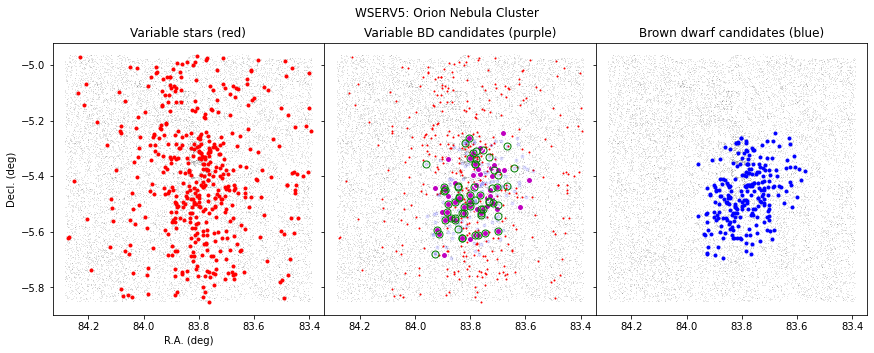

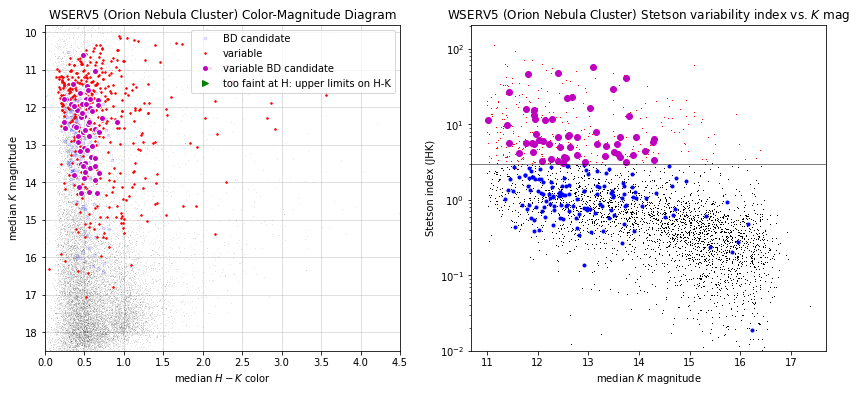

WSERV7 Q1 brown dwarf candidates: 85
WSERV7 Q1 brown dwarf candidates that are variable: 28
WSERV7 Q1 variables: 101



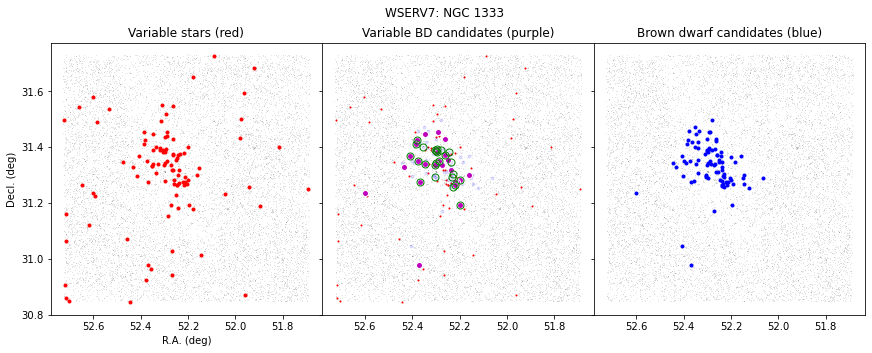

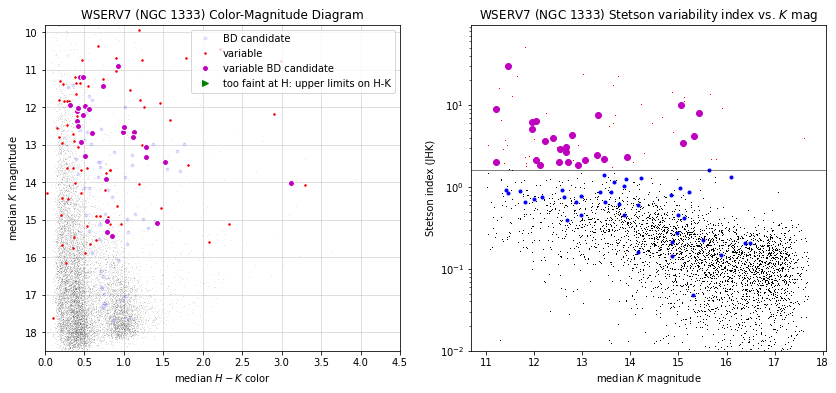

WSERV8 Q1 brown dwarf candidates: 193
WSERV8 Q1 brown dwarf candidates that are variable: 37
WSERV8 Q1 variables: 181



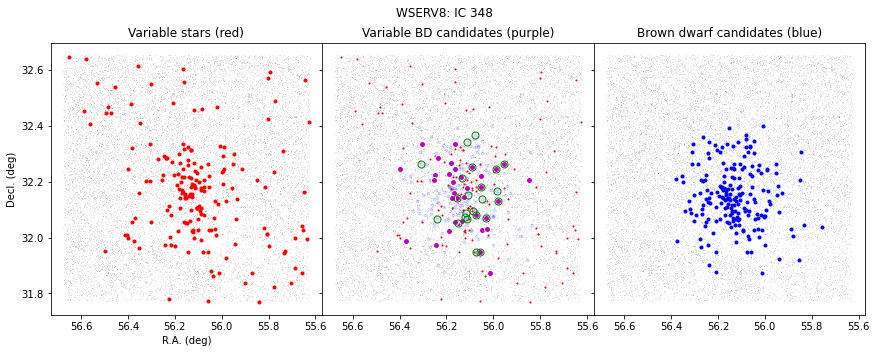

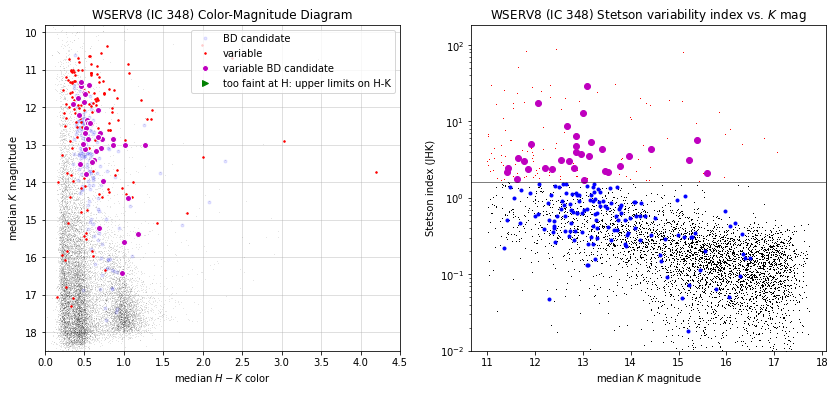

In [84]:
wserv_ids = [1, 5, 7, 8, 11]

# n_obs_list = [130, 120, 171, 85, 110]

n_min_list = [60, 35, 80, 55, 65]
n_max_list = [100, 90, 160, 80, 100]

min_Stetson_list = [2, 3, 1.6, 1.6, 4]

SFR_names = ["Cyg OB7", "Orion Nebula Cluster", "NGC 1333", "IC 348", "Mon R2"]
SFR_dict = {x: y for x, y in zip(wserv_ids, SFR_names)}

for wserv, n_min, n_max, S in list(zip(wserv_ids, n_min_list, n_max_list, min_Stetson_list)):
    if wserv in [5, 7, 8]:
    
        ds = spread[f'wserv{wserv}']

        q0 = sq0(ds, n_min, n_max)
        q1 = sq1(ds, n_min, n_max)
        q2 = sq2(ds, n_min, n_max)

        v0 = sq0_variables(ds, n_min, n_max, Stetson_cutoff=S)
        v1 = sq1_variables(ds, n_min, n_max, Stetson_cutoff=S)
        v2 = sq2_variables(ds, n_min, n_max, Stetson_cutoff=S)

#         bd = simple_BD_select_v2(ds, wserv)
        bd = np.in1d(ds.index, approved[wserv].values)
#         lowmass = np.in1d(ds['SOURCEID'], approved[wserv].value)

        per_bd = np.in1d(ds.index, periodic[wserv].values)


        fig, axes = plt.subplots(ncols=3, figsize=(14.6,5), sharex=True, sharey=True)

        for ax in axes:

            ax.plot(np.degrees(ds[q0]['mean']['RA']), np.degrees(ds[q0]['mean']['DEC']), 'k,', alpha=0.1)
            ax.invert_xaxis()

        axes[0].plot(np.degrees(ds[v1]['mean']['RA']), np.degrees(ds[v1]['mean']['DEC']), 'r.')

        axes[1].plot(np.degrees(ds[v1]['mean']['RA']), np.degrees(ds[v1]['mean']['DEC']), 'r.', ms=2)
        axes[1].plot(np.degrees(ds[q1 & bd]['mean']['RA']), np.degrees(ds[q1 & bd]['mean']['DEC']), 'bo', alpha=0.1, ms=3)
        axes[1].plot(np.degrees(ds[v1 & bd]['mean']['RA']), np.degrees(ds[v1 & bd]['mean']['DEC']), 'mo', markeredgecolor='w', ms=6)
        axes[1].plot(np.degrees(ds[q1 & per_bd]['mean']['RA']), np.degrees(ds[q1 & per_bd]['mean']['DEC']), 'go', markerfacecolor='None', ms=7, mew=1)

        axes[2].plot(np.degrees(ds[q1 & bd]['mean']['RA']), np.degrees(ds[q1 & bd]['mean']['DEC']), 'bo', ms=3)

        fig.suptitle(f"WSERV{wserv}: {SFR_dict[wserv]}")

        axes[0].set_title("Variable stars (red)")
        axes[1].set_title("Variable BD candidates (purple)")
        axes[2].set_title("Brown dwarf candidates (blue)")

        axes[0].set_xlabel("R.A. (deg)")
        axes[0].set_ylabel("Decl. (deg)")

        plt.subplots_adjust(wspace=0)


        # rieke & lebofsky 1985 reddening law
        A_K = 0.112
        A_H = 0.175
        E_HK = A_H - A_K # this is like a slope in color-mag space

#         J_BDlimit = apparent_BD_mags_jhk[wserv][0]
#         H_BDlimit = apparent_BD_mags_jhk[wserv][1]
#         K_BDlimit = apparent_BD_mags_jhk[wserv][2]

        fig2, (ax, ax2) = plt.subplots(ncols=2, figsize=(14,6))

        h = ds['median']['HAPERMAG3']
        k = ds['median']['KAPERMAG3']
        hmk = h-k

        h_e = ds['median']['HAPERMAG3ERR']
        k_e = ds['median']['KAPERMAG3ERR']
        hmk_e = (h_e**2 + k_e**2)**0.5

        hmk_limit = 19 - k
        no_h = np.isnan(ds['median']['HAPERMAG3'])

        ee = (hmk_e<1) & (k_e<1)

#         ax.plot(
#             [H_BDlimit-K_BDlimit, (H_BDlimit-K_BDlimit) + E_HK*30],
#             [K_BDlimit, K_BDlimit + A_K*30],
#             'r--', lw=2,
#             label='$A_V=30$ reddening vector',
#             scalex=False,
#             scaley=False
#         )

        asc = 0.1


        ax.plot(hmk[q0], k[q0], 'k,', alpha=asc)
        ax.plot(hmk[q1 & bd], k[q1 & bd], 'bo', alpha=asc, label='BD candidate', ms=3)
        ax.plot(hmk[v1], k[v1], 'r.', alpha=1, label='variable', ms=3)
        ax.plot(hmk[v1&bd], k[v1&bd], 'mo', alpha=1, label='variable BD candidate', markeredgecolor='w')
        ax.plot(hmk_limit[v1 & no_h], k[v1 & no_h], 'g>', alpha=1, label='too faint at H: upper limits on H-K')

        print(f"WSERV{wserv} Q1 brown dwarf candidates: {np.sum(q1&bd)}")
        print(f"WSERV{wserv} Q1 brown dwarf candidates that are variable: {np.sum(v1&bd)}")
        print(f"WSERV{wserv} Q1 variables: {np.sum(v1)}")
        print()
        ax.legend()
        ax.grid(True, alpha=0.5)

        ax.set_xlabel("median $H-K$ color")
        ax.set_ylabel("median $K$ magnitude")
        ax.set_title(f"WSERV{wserv} ({SFR_dict[wserv]}) Color-Magnitude Diagram")

        ax.set_xlim(0, 4.5)
        ax.set_ylim(18.5, 9.8)

        ax2.plot(ds[q2]['median']['KAPERMAG3'], ds[q2]['variability']['Stetson_JHK'], 'k,')
        ax2.plot(ds[q2 & bd]['median']['KAPERMAG3'], ds[q2 & bd]['variability']['Stetson_JHK'], 'bo', ms=3)
        ax2.plot(ds[q2 & v2]['median']['KAPERMAG3'], ds[q2 & v2]['variability']['Stetson_JHK'], 'r,')
        ax2.plot(ds[bd & v2]['median']['KAPERMAG3'], ds[bd & v2]['variability']['Stetson_JHK'], 'mo')
        ax2.semilogy()
        ax2.axhline(S, color='k', lw=1, alpha=0.5)
        ax2.set_ylim(1e-2, None)
        ax2.set_ylabel("Stetson index (JHK)")
        ax2.set_xlabel("median $K$ magnitude")

        ax2.set_title(f"WSERV{wserv} ({SFR_dict[wserv]}) Stetson variability index vs. $K$ mag")


        plt.show()


In [45]:
print( f"{63/237*100:.1f}%")
print( f"{28/85*100:.1f}%")
print( f"{37/193*100:.1f}%")

26.6%
32.9%
19.2%


In [46]:
wserv_ids = [1, 5, 7, 8, 11]

# n_obs_list = [130, 120, 171, 85, 110]

n_min_list = [60, 35, 80, 55, 65]
n_max_list = [100, 90, 160, 80, 100]

min_Stetson_list = [2, 3, 1.6, 1.6, 4]

SFR_names = ["Cyg OB7", "Orion Nebula Cluster", "NGC 1333", "IC 348", "Mon R2"]
SFR_dict = {x: y for x, y in zip(wserv_ids, SFR_names)}

for wserv, n_min, n_max, S in list(zip(wserv_ids, n_min_list, n_max_list, min_Stetson_list)):
    if wserv in [5, 7, 8]:
    
        ds = spread[f'wserv{wserv}']

        q0 = sq0(ds, n_min, n_max)
        q1 = sq1(ds, n_min, n_max)
        q2 = sq2(ds, n_min, n_max)

        v0 = sq0_variables(ds, n_min, n_max, Stetson_cutoff=S)
        v1 = sq1_variables(ds, n_min, n_max, Stetson_cutoff=S)
        v2 = sq2_variables(ds, n_min, n_max, Stetson_cutoff=S)

        bd = np.in1d(ds.index, approved[wserv].values)

        print(len(ds[v1 & bd]))
        print(ds[v1 & bd].index)


63
Int64Index([44199508468985, 44199508469125, 44199508469185, 44199508469253,
            44199508469586, 44199508469644, 44199508469840, 44199508469998,
            44199508470328, 44199508470345, 44199508470532, 44199508470557,
            44199508470698, 44199508470788, 44199508471300, 44199508471513,
            44199508511895, 44199508511927, 44199508511973, 44199508511996,
            44199508512349, 44199508512410, 44199508512424, 44199508512427,
            44199508512748, 44199508512752, 44199508512791, 44199508512819,
            44199508512886, 44199508512929, 44199508512965, 44199508513072,
            44199508513170, 44199508513251, 44199508513256, 44199508513257,
            44199508513711, 44199508513734, 44199508513747, 44199508513807,
            44199508513934, 44199508513990, 44199508514029, 44199508515254,
            44199508518585, 44199508518688, 44199508518735, 44199508518929,
            44199508518977, 44199508519002, 44199508519027, 44199508519145,
         

In [64]:
from wuvars.plotting.lightcurve import simple_lc_brokenaxes, simple_lc_scatter_brokenaxes
from wuvars.data import photometry, quality_classes
from wuvars.plotting.lightcurve_helpers import orion_cmap

wservs = [5, 7, 8]
# datasets = [group_wserv_v2(load_wserv_v2(wserv)) for wserv in wservs]

onc = {}
ngc = {}
ic = {}
dicts = [onc, ngc, ic]
dict_dict = {5: onc, 7:ngc, 8:ic}

onc["dat"] = photometry.group_wserv_v2(photometry.load_wserv_v2(5))
onc["q"] = quality_classes.load_q(5)
onc["spread"] = spreadsheet.load_wserv_v2(5)
onc["cmap"] = orion_cmap
onc['breaks'] = [250, 500]

ngc["dat"] = photometry.group_wserv_v2(photometry.load_wserv_v2(7))
ngc["q"] = quality_classes.load_q(7)
ngc["spread"] = spreadsheet.load_wserv_v2(7)
ngc["cmap"] = "jet"
ngc['breaks'] = []

ic["dat"] = photometry.group_wserv_v2(photometry.load_wserv_v2(8))
ic["q"] = quality_classes.load_q(8)
ic["spread"] = spreadsheet.load_wserv_v2(8)
ic["cmap"] = "jet_r"
ic['breaks'] = [50, 250]

region_names = ["ONC", "NGC1333", "IC348"]
short_names = ["ONC", "NGC", "IC"]

bands = ["J", "H", "K"]
                           

Loading WSERV5 photometry data... DONE (elapsed time: 0.20s)
Loading WSERV7 photometry data... DONE (elapsed time: 0.21s)
Loading WSERV8 photometry data... DONE (elapsed time: 0.19s)


63
Int64Index([44199508468985, 44199508469125, 44199508469185, 44199508469253,
            44199508469586, 44199508469644, 44199508469840, 44199508469998,
            44199508470328, 44199508470345, 44199508470532, 44199508470557,
            44199508470698, 44199508470788, 44199508471300, 44199508471513,
            44199508511895, 44199508511927, 44199508511973, 44199508511996,
            44199508512349, 44199508512410, 44199508512424, 44199508512427,
            44199508512748, 44199508512752, 44199508512791, 44199508512819,
            44199508512886, 44199508512929, 44199508512965, 44199508513072,
            44199508513170, 44199508513251, 44199508513256, 44199508513257,
            44199508513711, 44199508513734, 44199508513747, 44199508513807,
            44199508513934, 44199508513990, 44199508514029, 44199508515254,
            44199508518585, 44199508518688, 44199508518735, 44199508518929,
            44199508518977, 44199508519002, 44199508519027, 44199508519145,
         

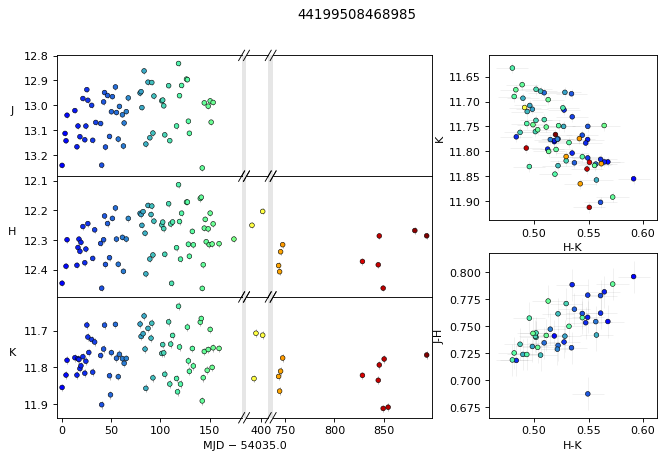

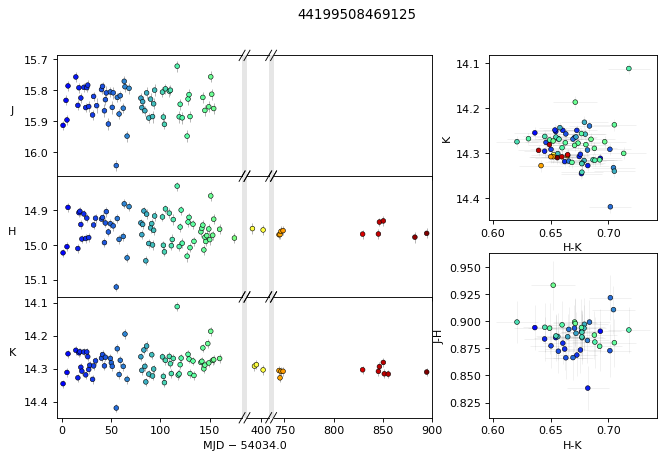

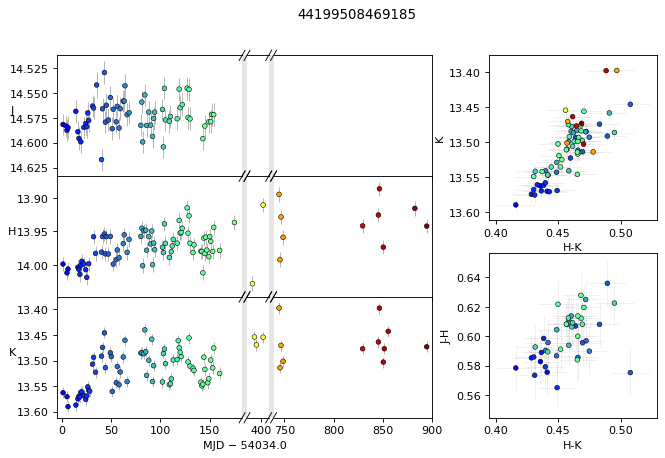

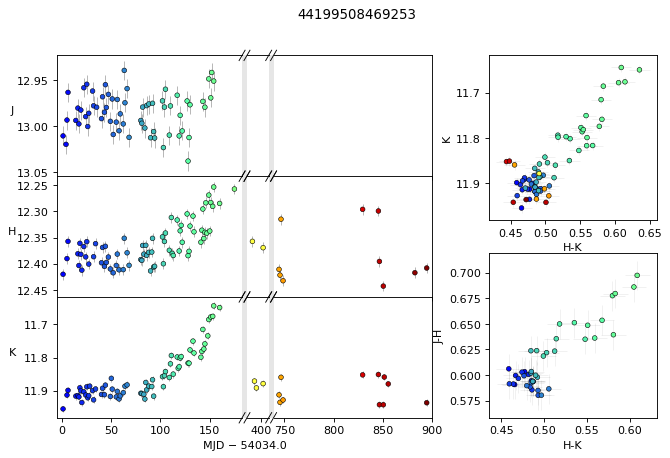

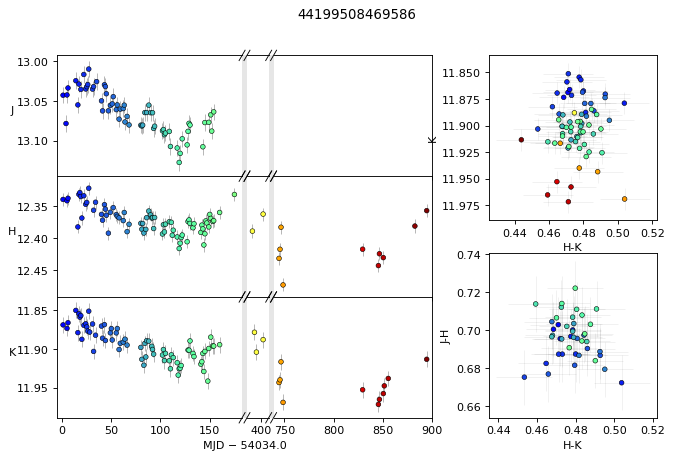

...

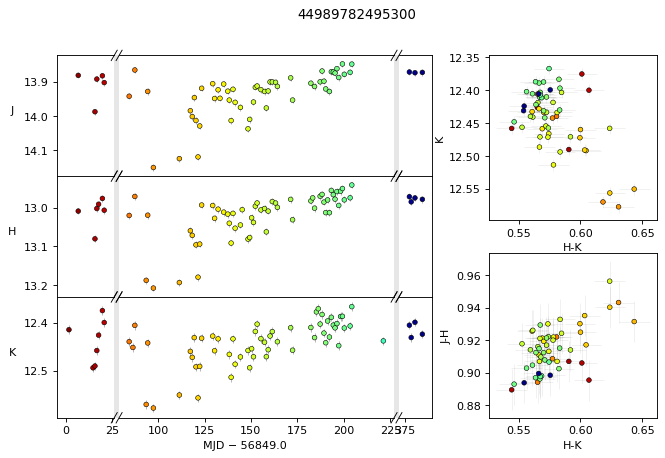

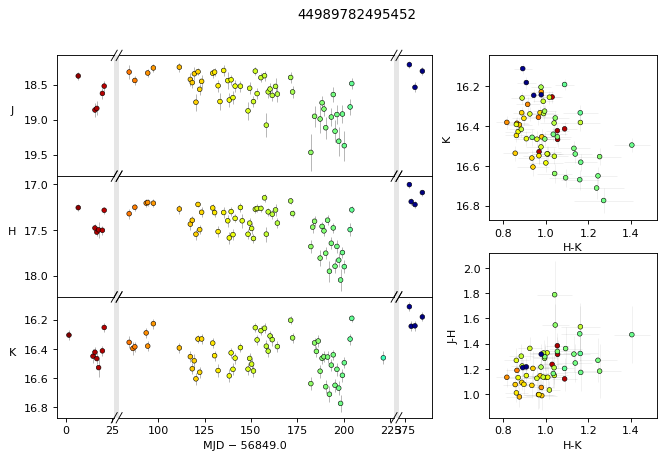

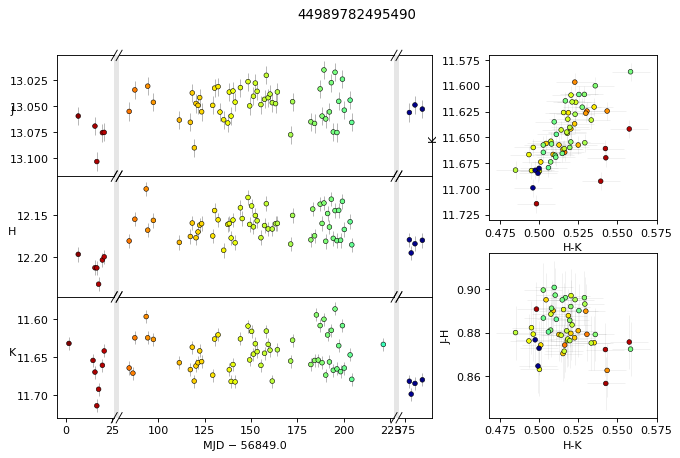

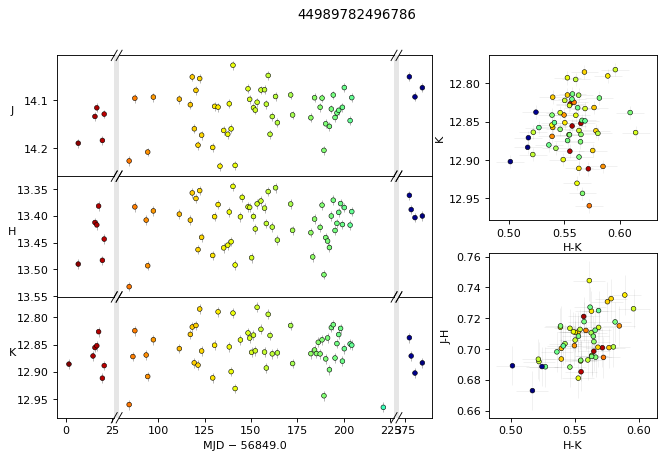

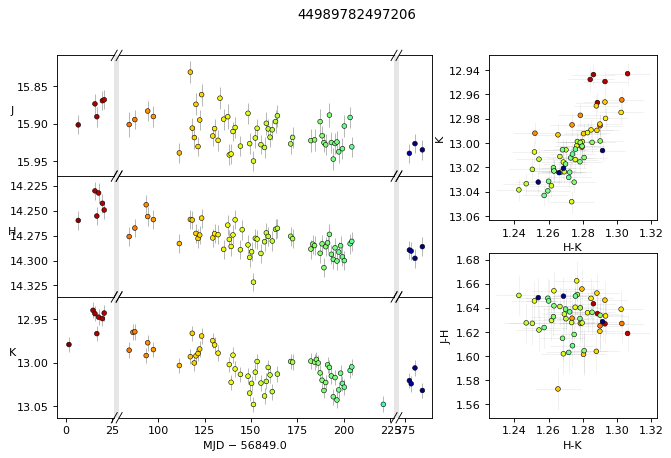

In [67]:
wserv_ids = [1, 5, 7, 8, 11]

# n_obs_list = [130, 120, 171, 85, 110]

n_min_list = [60, 35, 80, 55, 65]
n_max_list = [100, 90, 160, 80, 100]

min_Stetson_list = [2, 3, 1.6, 1.6, 4]

SFR_names = ["Cyg OB7", "Orion Nebula Cluster", "NGC 1333", "IC 348", "Mon R2"]
SFR_dict = {x: y for x, y in zip(wserv_ids, SFR_names)}

for wserv, n_min, n_max, S in list(zip(wserv_ids, n_min_list, n_max_list, min_Stetson_list)):
    if wserv in [5, 7, 8]:
    
        ds = spread[f'wserv{wserv}']
        dg = dict_dict[wserv]['dat']

        q0 = sq0(ds, n_min, n_max)
        q1 = sq1(ds, n_min, n_max)
        q2 = sq2(ds, n_min, n_max)

        v0 = sq0_variables(ds, n_min, n_max, Stetson_cutoff=S)
        v1 = sq1_variables(ds, n_min, n_max, Stetson_cutoff=S)
        v2 = sq2_variables(ds, n_min, n_max, Stetson_cutoff=S)

        bd = np.in1d(ds.index, approved[wserv].values)

        print(len(ds[v1 & bd]))
        print(ds[v1 & bd].index)
        
        for sid in ds[v1 & bd].index:
            simple_lc_scatter_brokenaxes(dg, sid, cmap=dict_dict[wserv]['cmap'], breaks=dict_dict[wserv]['breaks'])
            plt.suptitle(sid)
            
            


In [57]:
simple_lc_scatter_brokenaxes?